In [1]:
import pandas as pd
import numpy as np
import csv
import json
import matplotlib.pyplot as plt
import seaborn as sns
from bs4 import BeautifulSoup
import requests

In [42]:
df=pd.read_csv(r"C:\Users\apltk\Downloads\imdb_top_1000.csv")
df.head()

,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,https://m.media-amazon.com/images/M/MV5BMDFkYT...,The Shawshank Redemption,1994,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469"
1,https://m.media-amazon.com/images/M/MV5BM2MyNj...,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
2,https://m.media-amazon.com/images/M/MV5BMTMxNT...,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
3,https://m.media-amazon.com/images/M/MV5BMWMwMG...,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
4,https://m.media-amazon.com/images/M/MV5BMWU4N2...,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Poster_Link    1000 non-null   object 
 1   Series_Title   1000 non-null   object 
 2   Released_Year  1000 non-null   object 
 3   Certificate    899 non-null    object 
 4   Runtime        1000 non-null   object 
 5   Genre          1000 non-null   object 
 6   IMDB_Rating    1000 non-null   float64
 7   Overview       1000 non-null   object 
 8   Meta_score     843 non-null    float64
 9   Director       1000 non-null   object 
 10  Star1          1000 non-null   object 
 11  Star2          1000 non-null   object 
 12  Star3          1000 non-null   object 
 13  Star4          1000 non-null   object 
 14  No_of_Votes    1000 non-null   int64  
 15  Gross          831 non-null    object 
dtypes: float64(2), int64(1), object(13)
memory usage: 125.1+ KB


In [43]:
df = df.drop_duplicates()
df

,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,https://m.media-amazon.com/images/M/MV5BMDFkYT...,The Shawshank Redemption,1994,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469"
1,https://m.media-amazon.com/images/M/MV5BM2MyNj...,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
2,https://m.media-amazon.com/images/M/MV5BMTMxNT...,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
3,https://m.media-amazon.com/images/M/MV5BMWMwMG...,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
4,https://m.media-amazon.com/images/M/MV5BMWU4N2...,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"
5,https://m.media-amazon.com/images/M/MV5BNzA5ZD...,The Lord of the Rings: The Return of the King,2003,U,201 min,"Action, Adventure, Drama",8.9,Gandalf and Aragorn lead the World of Men agai...,94.0,Peter Jackson,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,1642758,"377,845,905"
6,https://m.media-amazon.com/images/M/MV5BNGNhMD...,Pulp Fiction,1994,A,154 min,"Crime, Drama",8.9,"The lives of two mob hitmen, a boxer, a gangst...",94.0,Quentin Tarantino,John Travolta,Uma Thurman,Samuel L. Jackson,Bruce Willis,1826188,"107,928,762"
7,https://m.media-amazon.com/images/M/MV5BNDE4OT...,Schindler's List,1993,A,195 min,"Biography, Drama, History",8.9,"In German-occupied Poland during World War II,...",94.0,Steven Spielberg,Liam Neeson,Ralph Fiennes,Ben Kingsley,Caroline Goodall,1213505,"96,898,818"
8,https://m.media-amazon.com/images/M/MV5BMjAxMz...,Inception,2010,UA,148 min,"Action, Adventure, Sci-Fi",8.8,A thief who steals corporate secrets through t...,74.0,Christopher Nolan,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,2067042,"292,576,195"
9,https://m.media-amazon.com/images/M/MV5BMmEzNT...,Fight Club,1999,A,139 min,Drama,8.8,An insomniac office worker and a devil-may-car...,66.0,David Fincher,Brad Pitt,Edward Norton,Meat Loaf,Zach Grenier,1854740,"37,030,102"


In [7]:

df.describe()

,IMDB_Rating,Meta_score,No_of_Votes
count,1000.000000,843.000000,1.000000e+03
mean,7.949300,77.971530,2.736929e+05
std,0.275491,12.376099,3.273727e+05
min,7.600000,28.000000,2.508800e+04
25%,7.700000,70.000000,5.552625e+04
50%,7.900000,79.000000,1.385485e+05
75%,8.100000,87.000000,3.741612e+05
max,9.300000,100.000000,2.343110e+06


In [8]:
df.isnull().sum()

Poster_Link        0
Series_Title       0
Released_Year      0
Certificate      101
Runtime            0
Genre              0
IMDB_Rating        0
Overview           0
Meta_score       157
Director           0
Star1              0
Star2              0
Star3              0
Star4              0
No_of_Votes        0
Gross            169
dtype: int64

In [44]:
df=df.fillna('')
df

,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,https://m.media-amazon.com/images/M/MV5BMDFkYT...,The Shawshank Redemption,1994,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469"
1,https://m.media-amazon.com/images/M/MV5BM2MyNj...,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
2,https://m.media-amazon.com/images/M/MV5BMTMxNT...,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
3,https://m.media-amazon.com/images/M/MV5BMWMwMG...,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
4,https://m.media-amazon.com/images/M/MV5BMWU4N2...,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"
5,https://m.media-amazon.com/images/M/MV5BNzA5ZD...,The Lord of the Rings: The Return of the King,2003,U,201 min,"Action, Adventure, Drama",8.9,Gandalf and Aragorn lead the World of Men agai...,94.0,Peter Jackson,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,1642758,"377,845,905"
6,https://m.media-amazon.com/images/M/MV5BNGNhMD...,Pulp Fiction,1994,A,154 min,"Crime, Drama",8.9,"The lives of two mob hitmen, a boxer, a gangst...",94.0,Quentin Tarantino,John Travolta,Uma Thurman,Samuel L. Jackson,Bruce Willis,1826188,"107,928,762"
7,https://m.media-amazon.com/images/M/MV5BNDE4OT...,Schindler's List,1993,A,195 min,"Biography, Drama, History",8.9,"In German-occupied Poland during World War II,...",94.0,Steven Spielberg,Liam Neeson,Ralph Fiennes,Ben Kingsley,Caroline Goodall,1213505,"96,898,818"
8,https://m.media-amazon.com/images/M/MV5BMjAxMz...,Inception,2010,UA,148 min,"Action, Adventure, Sci-Fi",8.8,A thief who steals corporate secrets through t...,74.0,Christopher Nolan,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,2067042,"292,576,195"
9,https://m.media-amazon.com/images/M/MV5BMmEzNT...,Fight Club,1999,A,139 min,Drama,8.8,An insomniac office worker and a devil-may-car...,66.0,David Fincher,Brad Pitt,Edward Norton,Meat Loaf,Zach Grenier,1854740,"37,030,102"


In [45]:

df = df.drop(columns = "Poster_Link")

df

,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,The Shawshank Redemption,1994,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469"
1,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
2,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
3,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
4,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"
5,The Lord of the Rings: The Return of the King,2003,U,201 min,"Action, Adventure, Drama",8.9,Gandalf and Aragorn lead the World of Men agai...,94.0,Peter Jackson,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,1642758,"377,845,905"
6,Pulp Fiction,1994,A,154 min,"Crime, Drama",8.9,"The lives of two mob hitmen, a boxer, a gangst...",94.0,Quentin Tarantino,John Travolta,Uma Thurman,Samuel L. Jackson,Bruce Willis,1826188,"107,928,762"
7,Schindler's List,1993,A,195 min,"Biography, Drama, History",8.9,"In German-occupied Poland during World War II,...",94.0,Steven Spielberg,Liam Neeson,Ralph Fiennes,Ben Kingsley,Caroline Goodall,1213505,"96,898,818"
8,Inception,2010,UA,148 min,"Action, Adventure, Sci-Fi",8.8,A thief who steals corporate secrets through t...,74.0,Christopher Nolan,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,2067042,"292,576,195"
9,Fight Club,1999,A,139 min,Drama,8.8,An insomniac office worker and a devil-may-car...,66.0,David Fincher,Brad Pitt,Edward Norton,Meat Loaf,Zach Grenier,1854740,"37,030,102"


In [12]:
df['Released_Year'].plot(kind='hist', bins=10, title='Распределение по годам')
plt.xlabel('Количество фильмов')
plt.ylabel('Частота')
plt.show()

TypeError: no numeric data to plot

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Series_Title   1000 non-null   object 
 1   Released_Year  1000 non-null   object 
 2   Certificate    1000 non-null   object 
 3   Runtime        1000 non-null   object 
 4   Genre          1000 non-null   object 
 5   IMDB_Rating    1000 non-null   float64
 6   Overview       1000 non-null   object 
 7   Meta_score     1000 non-null   object 
 8   Director       1000 non-null   object 
 9   Star1          1000 non-null   object 
 10  Star2          1000 non-null   object 
 11  Star3          1000 non-null   object 
 12  Star4          1000 non-null   object 
 13  No_of_Votes    1000 non-null   int64  
 14  Gross          1000 non-null   object 
dtypes: float64(1), int64(1), object(13)
memory usage: 117.3+ KB


In [22]:
df['Released_Year'] = df['Released_Year'].astype(int)

ValueError: invalid literal for int() with base 10: 'PG'

In [47]:
pd.set_option('display.max_rows', None)  # Вывод всех строк
pd.set_option('display.max_columns', None)
df

,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,The Shawshank Redemption,1994,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469"
1,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
2,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
3,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
4,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"
5,The Lord of the Rings: The Return of the King,2003,U,201 min,"Action, Adventure, Drama",8.9,Gandalf and Aragorn lead the World of Men agai...,94.0,Peter Jackson,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,1642758,"377,845,905"
6,Pulp Fiction,1994,A,154 min,"Crime, Drama",8.9,"The lives of two mob hitmen, a boxer, a gangst...",94.0,Quentin Tarantino,John Travolta,Uma Thurman,Samuel L. Jackson,Bruce Willis,1826188,"107,928,762"
7,Schindler's List,1993,A,195 min,"Biography, Drama, History",8.9,"In German-occupied Poland during World War II,...",94.0,Steven Spielberg,Liam Neeson,Ralph Fiennes,Ben Kingsley,Caroline Goodall,1213505,"96,898,818"
8,Inception,2010,UA,148 min,"Action, Adventure, Sci-Fi",8.8,A thief who steals corporate secrets through t...,74.0,Christopher Nolan,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,2067042,"292,576,195"
9,Fight Club,1999,A,139 min,Drama,8.8,An insomniac office worker and a devil-may-car...,66.0,David Fincher,Brad Pitt,Edward Norton,Meat Loaf,Zach Grenier,1854740,"37,030,102"


In [48]:
# Попытка преобразования столбца Released_Year в числовой формат, нечисловые значения станут NaN
df['Released_Year'] = pd.to_numeric(df['Released_Year'], errors='coerce')

# Проверка наличия NaN в столбце Released_Year_numeric
non_numeric_values = df[df['Released_Year'].isnull()]

if non_numeric_values.empty:
    print("Все значения в столбце Released_Year являются числами.")
else:
    print("Есть нечисловые значения в столбце Released_Year:")
    print(non_numeric_values)

Есть нечисловые значения в столбце Released_Year:
    Series_Title  Released_Year Certificate  Runtime  \
966    Apollo 13            NaN           U  140 min   

                         Genre  IMDB_Rating  \
966  Adventure, Drama, History          7.6   

                                              Overview Meta_score    Director  \
966  NASA must devise a strategy to return Apollo 1...       77.0  Ron Howard   

         Star1        Star2        Star3        Star4  No_of_Votes  \
966  Tom Hanks  Bill Paxton  Kevin Bacon  Gary Sinise       269197   

           Gross  
966  173,837,933  


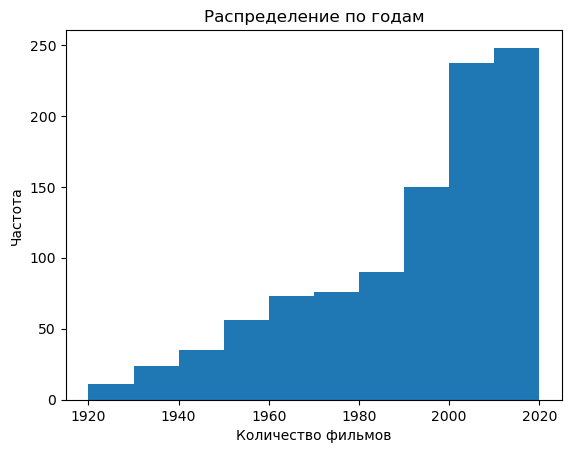

In [51]:
df['Released_Year'].plot(kind='hist', bins=10, title='Распределение по годам')
plt.xlabel('Количество фильмов')
plt.ylabel('Частота')
plt.show()

In [29]:
df[df['Series_Title']]

,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,The Shawshank Redemption,1994.0,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469"
1,The Godfather,1972.0,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
2,The Dark Knight,2008.0,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
3,The Godfather: Part II,1974.0,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
4,12 Angry Men,1957.0,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"
5,The Lord of the Rings: The Return of the King,2003.0,U,201 min,"Action, Adventure, Drama",8.9,Gandalf and Aragorn lead the World of Men agai...,94.0,Peter Jackson,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,1642758,"377,845,905"
6,Pulp Fiction,1994.0,A,154 min,"Crime, Drama",8.9,"The lives of two mob hitmen, a boxer, a gangst...",94.0,Quentin Tarantino,John Travolta,Uma Thurman,Samuel L. Jackson,Bruce Willis,1826188,"107,928,762"
7,Schindler's List,1993.0,A,195 min,"Biography, Drama, History",8.9,"In German-occupied Poland during World War II,...",94.0,Steven Spielberg,Liam Neeson,Ralph Fiennes,Ben Kingsley,Caroline Goodall,1213505,"96,898,818"
8,Inception,2010.0,UA,148 min,"Action, Adventure, Sci-Fi",8.8,A thief who steals corporate secrets through t...,74.0,Christopher Nolan,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,2067042,"292,576,195"
9,Fight Club,1999.0,A,139 min,Drama,8.8,An insomniac office worker and a devil-may-car...,66.0,David Fincher,Brad Pitt,Edward Norton,Meat Loaf,Zach Grenier,1854740,"37,030,102"


In [50]:
df.at[966, 'Released_Year'] = 1985

In [31]:
df.iloc[966]

Series_Title                                             Apollo 13
Released_Year                                               1985.0
Certificate                                                      U
Runtime                                                    140 min
Genre                                    Adventure, Drama, History
IMDB_Rating                                                    7.6
Overview         NASA must devise a strategy to return Apollo 1...
Meta_score                                                    77.0
Director                                                Ron Howard
Star1                                                    Tom Hanks
Star2                                                  Bill Paxton
Star3                                                  Kevin Bacon
Star4                                                  Gary Sinise
No_of_Votes                                                 269197
Gross                                                  173,837

In [52]:
import seaborn as sns

# Построение регрессионной модели и scatter plot
sns.lmplot(x='duration', y='kills', data=df_heroes_am, line_kws={'color': 'red'})
plt.title('Зависимость количества убийств от длительности матча')
plt.xlabel('Длительность матча')
plt.ylabel('Количество убийств')
plt.show()

NameError: name 'df_heroes_am' is not defined

In [180]:
average_ratings_by_year =df.groupby('Released_Year')['IMDB_Rating'].mean()
average_ratings_by_year.head(10)

Released_Year
1920.0    8.1
1921.0    8.3
1922.0    7.9
1924.0    8.2
1925.0    8.1
1926.0    8.1
1927.0    8.2
1928.0    8.1
1930.0    8.0
1931.0    8.2
Name: IMDB_Rating, dtype: float64

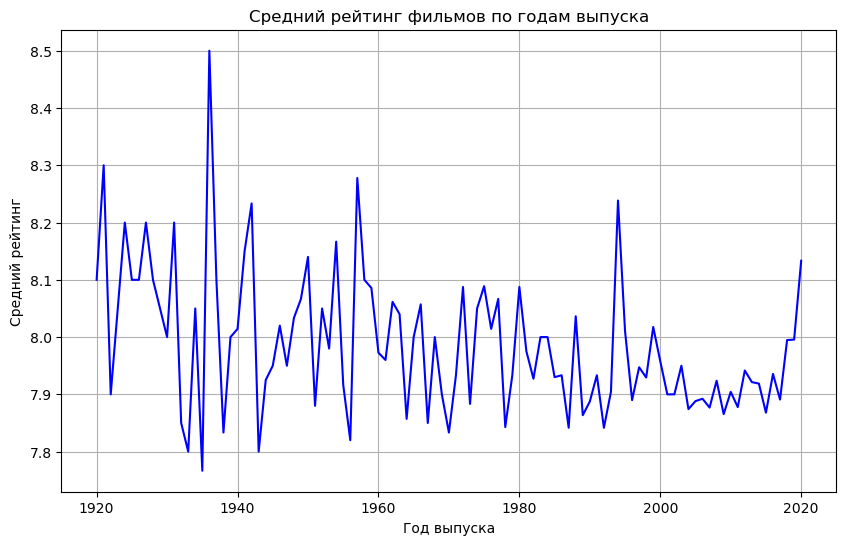

In [54]:
# Построение линейного графика среднего рейтинга фильмов по годам
plt.figure(figsize=(10, 6))
average_ratings_by_year.plot(kind='line', color='blue')
plt.title('Средний рейтинг фильмов по годам выпуска')
plt.xlabel('Год выпуска')
plt.ylabel('Средний рейтинг')
plt.grid(True)
plt.show()

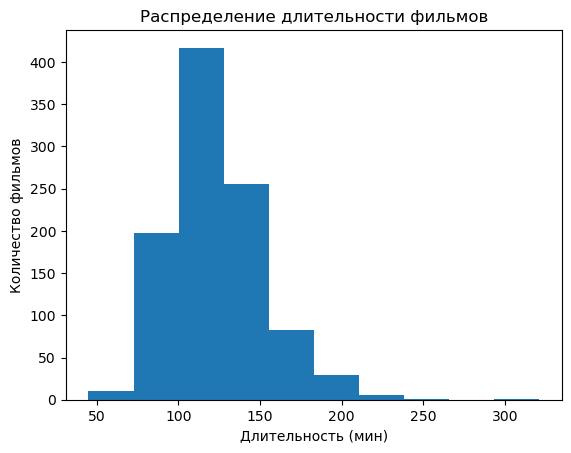

In [65]:
df['Runtime'].plot(kind='hist', bins=10, title='Распределение длительности фильмов')
plt.xlabel('Длительность (мин)')
plt.ylabel('Количество фильмов')
plt.show()

In [62]:
df['Runtime']=df['Runtime'].str.extract('(\d+)').astype(float)

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Series_Title   1000 non-null   object 
 1   Released_Year  1000 non-null   float64
 2   Certificate    1000 non-null   object 
 3   Runtime        1000 non-null   object 
 4   Genre          1000 non-null   object 
 5   IMDB_Rating    1000 non-null   float64
 6   Overview       1000 non-null   object 
 7   Meta_score     1000 non-null   object 
 8   Director       1000 non-null   object 
 9   Star1          1000 non-null   object 
 10  Star2          1000 non-null   object 
 11  Star3          1000 non-null   object 
 12  Star4          1000 non-null   object 
 13  No_of_Votes    1000 non-null   int64  
 14  Gross          1000 non-null   object 
dtypes: float64(2), int64(1), object(12)
memory usage: 117.3+ KB


In [76]:
average_score_by_certificate =df.groupby('Certificate')['IMDB_Rating'].mean()
average_score_by_certificate

Certificate
            7.931683
16          8.100000
A           7.998985
Approved    7.945455
G           8.000000
GP          7.850000
PG          7.927027
PG-13       7.797674
Passed      8.020588
R           7.869863
TV-14       8.300000
TV-MA       8.100000
TV-PG       7.900000
U           7.976923
U/A         7.600000
UA          7.957143
Unrated     8.100000
Name: IMDB_Rating, dtype: float64

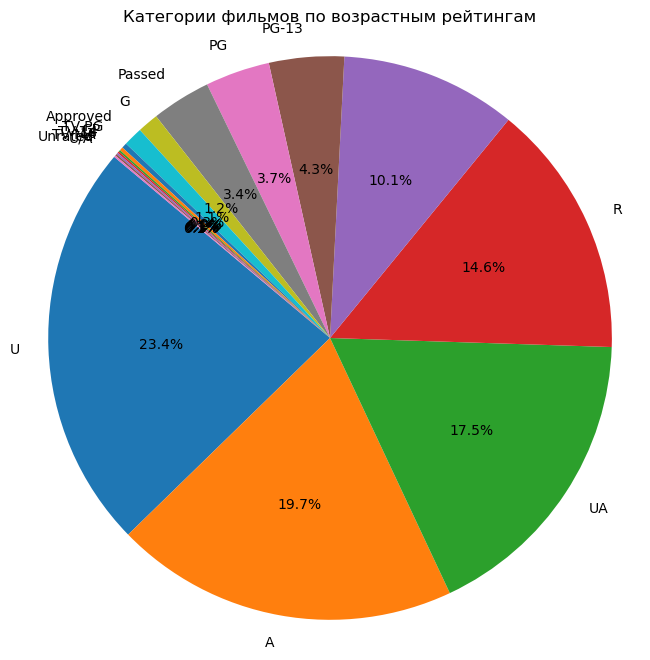

In [74]:
# Создание списка значений и меток для круговой диаграммы

labels = ['Процент побед', 'Процент поражений']

# Построение круговой диаграммы
plt.figure(figsize=(8, 8))
plt.pie(certificate_counts, labels=certificate_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Категории фильмов по возрастным рейтингам')
plt.axis('equal')  # Отображение в виде круга
plt.show()

In [68]:
df['Certificate'].describe()

count     1000
unique      17
top          U
freq       234
Name: Certificate, dtype: object

In [71]:
certificate_counts =df['Certificate'].value_counts()
certificate_counts

Certificate
U           234
A           197
UA          175
R           146
            101
PG-13        43
PG           37
Passed       34
G            12
Approved     11
TV-PG         3
GP            2
TV-14         1
16            1
TV-MA         1
Unrated       1
U/A           1
Name: count, dtype: int64

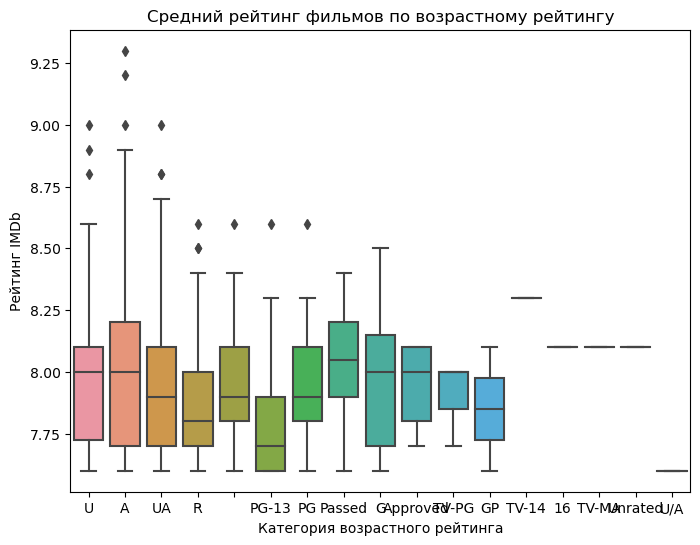

In [77]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='Certificate', y='IMDB_Rating', data=df, order=df['Certificate'].value_counts().index)
plt.title('Средний рейтинг фильмов по возрастному рейтингу')
plt.xlabel('Категория возрастного рейтинга')
plt.ylabel('Рейтинг IMDb')
plt.show()

In [79]:
df['Genre'].plot(kind='hist', bins=10, title='Распределение длительности фильмов')
plt.xlabel('Длительность (мин)')
plt.ylabel('Количество фильмов')
plt.show()

TypeError: no numeric data to plot

In [82]:
genre_counts =df['Genre'].value_counts()
genre_counts

Genre
Drama                            85
Drama, Romance                   37
Comedy, Drama                    35
Comedy, Drama, Romance           31
Action, Crime, Drama             30
Biography, Drama, History        28
Crime, Drama, Thriller           28
Crime, Drama, Mystery            27
Crime, Drama                     26
Animation, Adventure, Comedy     24
Action, Adventure, Sci-Fi        21
Biography, Crime, Drama          16
Drama, War                       15
Comedy, Crime, Drama             15
Action, Adventure, Drama         14
Drama, Thriller                  14
Comedy                           13
Biography, Drama                 12
Animation, Action, Adventure     11
Action, Adventure, Comedy        10
Action, Crime, Thriller          10
Animation, Adventure, Family      9
Drama, Mystery, Thriller          9
Mystery, Thriller                 9
Biography, Drama, Sport           9
Adventure, Comedy, Drama          8
Action, Biography, Drama          7
Comedy, Drama, Family 

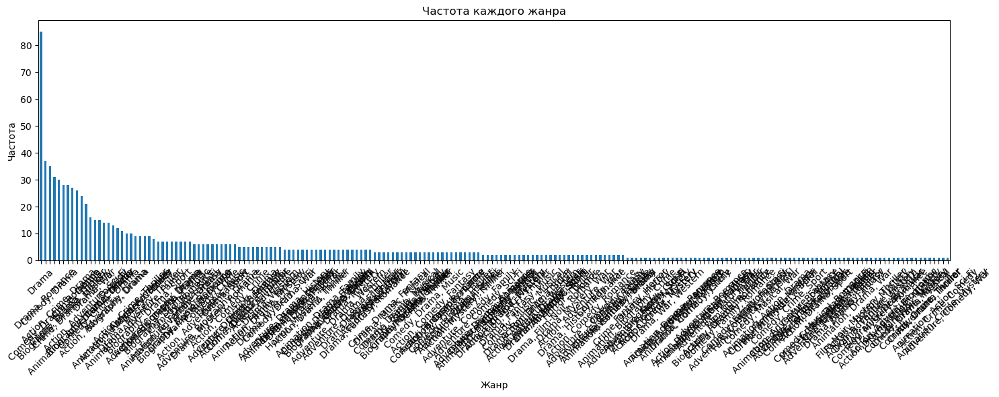

In [89]:
plt.figure(figsize=(15, 6))
genre_counts.plot(kind='bar')
plt.title('Частота каждого жанра')
plt.xlabel('Жанр')
plt.ylabel('Частота')
plt.xticks(rotation=45)  # Поворот меток по оси X для удобства чтения
plt.tight_layout()
plt.show()

In [90]:
genre_counts2 = df['Genre'].str.split(', ').explode().value_counts()
genre_counts2

Genre
Drama        724
Comedy       233
Crime        209
Adventure    196
Action       189
Thriller     137
Romance      125
Biography    109
Mystery       99
Animation     82
Sci-Fi        67
Fantasy       66
History       56
Family        56
War           51
Music         35
Horror        32
Western       20
Film-Noir     19
Sport         19
Musical       17
Name: count, dtype: int64

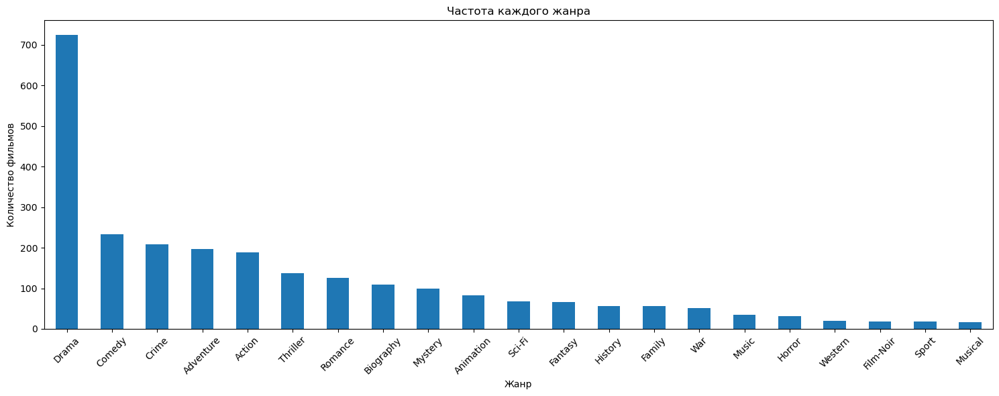

In [92]:
plt.figure(figsize=(15, 6))
genre_counts2.plot(kind='bar')
plt.title('Частота каждого жанра')
plt.xlabel('Жанр')
plt.ylabel('Количество фильмов')
plt.xticks(rotation=45)  # Поворот меток по оси X для удобства чтения
plt.tight_layout()
plt.show()

In [93]:
average_score_by_genre =df.groupby(genre_counts2.index)['IMDB_Rating'].mean()
average_score_by_genre

ValueError: Grouper and axis must be same length

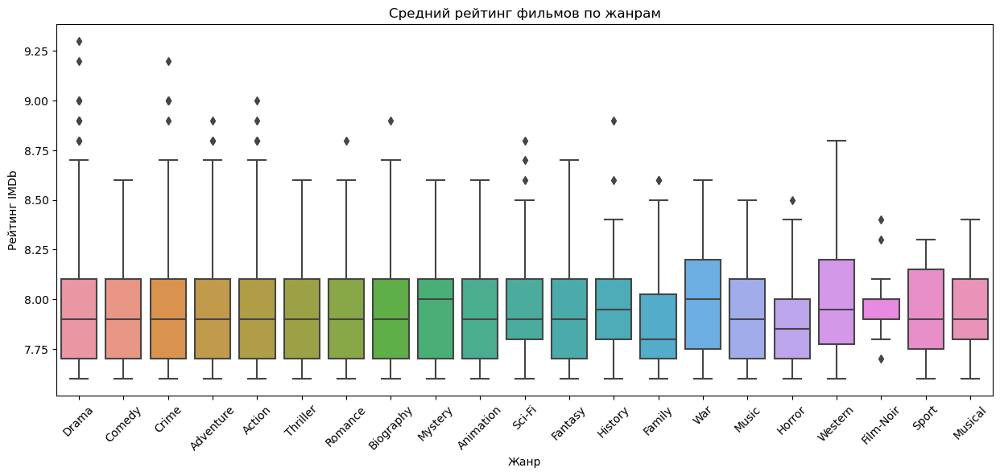

In [109]:
plt.figure(figsize=(15, 6))
sns.boxplot(x='Genre', y='IMDB_Rating', data=df, order=genre_counts2.index)
plt.title('Средний рейтинг фильмов по жанрам')
plt.xlabel('Жанр')
plt.xticks(rotation=45)
plt.ylabel('Рейтинг IMDb')
plt.show()

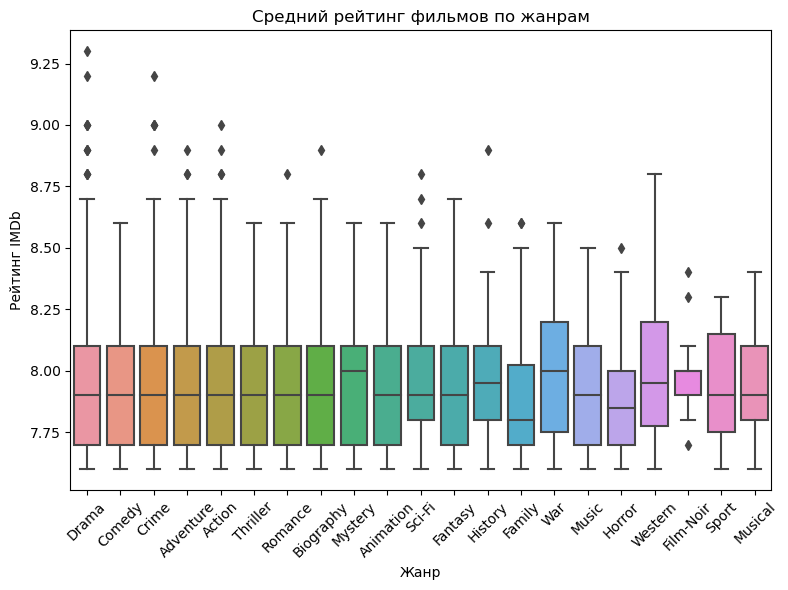

In [97]:
df['Genre'] = df['Genre'].str.split(', ')
df = df.explode('Genre')

plt.figure(figsize=(8, 6))
sns.boxplot(x='Genre', y='IMDB_Rating', data=df, order=df['Genre'].value_counts().index)
plt.title('Средний рейтинг фильмов по жанрам')
plt.xlabel('Жанр')
plt.ylabel('Рейтинг IMDb')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [98]:
df

,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,The Shawshank Redemption,1994.0,A,142.0,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469"
1,The Godfather,1972.0,A,175.0,Crime,9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
1,The Godfather,1972.0,A,175.0,Drama,9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
2,The Dark Knight,2008.0,UA,152.0,Action,9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
2,The Dark Knight,2008.0,UA,152.0,Crime,9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
2,The Dark Knight,2008.0,UA,152.0,Drama,9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
3,The Godfather: Part II,1974.0,A,202.0,Crime,9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
3,The Godfather: Part II,1974.0,A,202.0,Drama,9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
4,12 Angry Men,1957.0,U,96.0,Crime,9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"
4,12 Angry Men,1957.0,U,96.0,Drama,9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"


In [104]:
df['Genre'].value_counts()

Genre
Drama        724
Comedy       233
Crime        209
Adventure    196
Action       189
Thriller     137
Romance      125
Biography    109
Mystery       99
Animation     82
Sci-Fi        67
Fantasy       66
History       56
Family        56
War           51
Music         35
Horror        32
Western       20
Film-Noir     19
Sport         19
Musical       17
Name: count, dtype: int64

In [100]:
df2=pd.read_csv(r"C:\Users\apltk\Downloads\imdb_top_1000.csv")
df2.head()

,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,https://m.media-amazon.com/images/M/MV5BMDFkYT...,The Shawshank Redemption,1994,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469"
1,https://m.media-amazon.com/images/M/MV5BM2MyNj...,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
2,https://m.media-amazon.com/images/M/MV5BMTMxNT...,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
3,https://m.media-amazon.com/images/M/MV5BMWMwMG...,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
4,https://m.media-amazon.com/images/M/MV5BMWU4N2...,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"


In [101]:
df2['Genre'].str.split(', ')


0                              [Drama]
1                       [Crime, Drama]
2               [Action, Crime, Drama]
3                       [Crime, Drama]
4                       [Crime, Drama]
5           [Action, Adventure, Drama]
6                       [Crime, Drama]
7          [Biography, Drama, History]
8          [Action, Adventure, Sci-Fi]
9                              [Drama]
10          [Action, Adventure, Drama]
11                    [Drama, Romance]
12                           [Western]
13          [Action, Adventure, Drama]
14                    [Action, Sci-Fi]
15           [Biography, Crime, Drama]
16        [Action, Adventure, Fantasy]
17                             [Drama]
18         [Biography, Drama, History]
19           [Comedy, Drama, Thriller]
20                             [Drama]
21          [Adventure, Drama, Sci-Fi]
22                      [Crime, Drama]
23      [Animation, Adventure, Family]
24                        [Drama, War]
25             [Crime, Dr

In [105]:
 df2['Genre'].str.split(', ').explode().value_counts()

Genre
Drama        724
Comedy       233
Crime        209
Adventure    196
Action       189
Thriller     137
Romance      125
Biography    109
Mystery       99
Animation     82
Sci-Fi        67
Fantasy       66
History       56
Family        56
War           51
Music         35
Horror        32
Western       20
Film-Noir     19
Sport         19
Musical       17
Name: count, dtype: int64

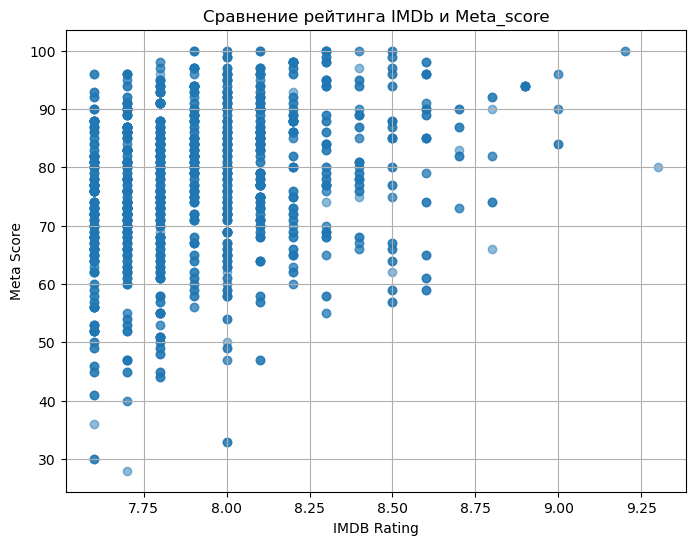

In [126]:
plt.figure(figsize=(8, 6))
plt.scatter(df['IMDB_Rating'], df['Meta_score'], alpha=0.5)  # alpha задает прозрачность точек
plt.title('Сравнение рейтинга IMDb и Meta_score')
plt.xlabel('IMDB Rating')
plt.ylabel('Meta Score')
plt.grid(True)  # Включение сетки для лучшей читаемости

plt.show()

In [115]:
pd.to_numeric(df['IMDB_Rating'])

0      9.3
1      9.2
1      9.2
2      9.0
2      9.0
2      9.0
3      9.0
3      9.0
4      9.0
4      9.0
5      8.9
5      8.9
5      8.9
6      8.9
6      8.9
7      8.9
7      8.9
7      8.9
8      8.8
8      8.8
8      8.8
9      8.8
10     8.8
10     8.8
10     8.8
11     8.8
11     8.8
12     8.8
13     8.7
13     8.7
13     8.7
14     8.7
14     8.7
15     8.7
15     8.7
15     8.7
16     8.7
16     8.7
16     8.7
17     8.7
18     8.6
18     8.6
18     8.6
19     8.6
19     8.6
19     8.6
20     8.6
21     8.6
21     8.6
21     8.6
22     8.6
22     8.6
23     8.6
23     8.6
23     8.6
24     8.6
24     8.6
25     8.6
25     8.6
25     8.6
26     8.6
26     8.6
26     8.6
27     8.6
27     8.6
27     8.6
28     8.6
28     8.6
28     8.6
29     8.6
29     8.6
29     8.6
30     8.6
30     8.6
30     8.6
31     8.6
31     8.6
31     8.6
32     8.6
32     8.6
32     8.6
33     8.5
33     8.5
33     8.5
34     8.5
34     8.5
35     8.5
35     8.5
35     8.5
36     8.5
36     8.5

In [119]:
df['Meta_score']=pd.to_numeric(df['Meta_score'])

In [117]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2541 entries, 0 to 999
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Series_Title   2541 non-null   object 
 1   Released_Year  2541 non-null   float64
 2   Certificate    2541 non-null   object 
 3   Runtime        2541 non-null   float64
 4   Genre          2541 non-null   object 
 5   IMDB_Rating    2541 non-null   float64
 6   Overview       2541 non-null   object 
 7   Meta_score     2541 non-null   object 
 8   Director       2541 non-null   object 
 9   Star1          2541 non-null   object 
 10  Star2          2541 non-null   object 
 11  Star3          2541 non-null   object 
 12  Star4          2541 non-null   object 
 13  No_of_Votes    2541 non-null   int64  
 14  Gross          2541 non-null   object 
dtypes: float64(3), int64(1), object(11)
memory usage: 317.6+ KB


C:\Users\apltk\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


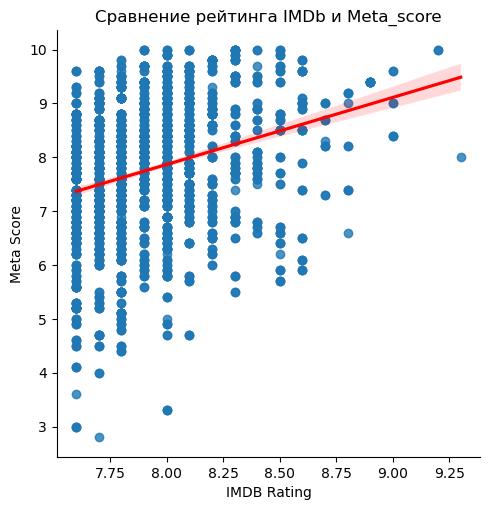

In [136]:
import seaborn as sns

# Построение регрессионной модели и scatter plot
sns.lmplot(x='IMDB_Rating', y='Meta_score_10', data=df, line_kws={'color': 'red'})
plt.title('Сравнение рейтинга IMDb и Meta_score')
plt.xlabel('IMDB Rating')
plt.ylabel('Meta Score')
plt.show()

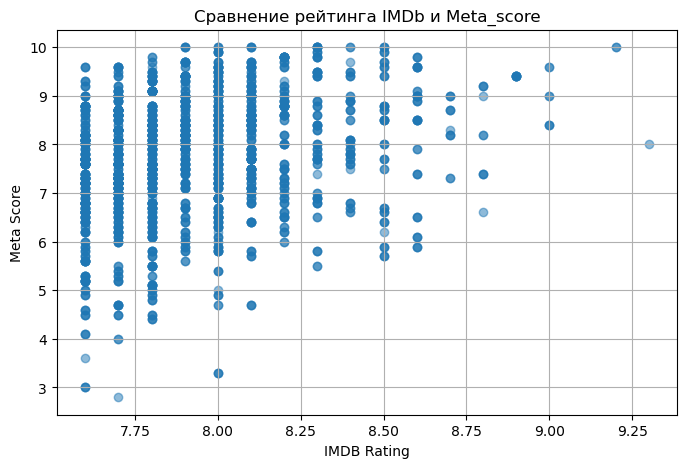

In [134]:
plt.figure(figsize=(8, 5))
plt.scatter(df['IMDB_Rating'], df['Meta_score_10'], alpha=0.5)
plt.title('Сравнение рейтинга IMDb и Meta_score')
plt.xlabel('IMDB Rating')
plt.ylabel('Meta Score')
plt.grid(True)
  
plt.show()



In [130]:
df['Meta_score_10'] = df['Meta_score'] / 10

In [135]:
df['Meta_score_10']

0       8.0
1      10.0
1      10.0
2       8.4
2       8.4
2       8.4
3       9.0
3       9.0
4       9.6
4       9.6
5       9.4
5       9.4
5       9.4
6       9.4
6       9.4
7       9.4
7       9.4
7       9.4
8       7.4
8       7.4
8       7.4
9       6.6
10      9.2
10      9.2
10      9.2
11      8.2
11      8.2
12      9.0
13      8.7
13      8.7
13      8.7
14      7.3
14      7.3
15      9.0
15      9.0
15      9.0
16      8.2
16      8.2
16      8.2
17      8.3
18      9.0
18      9.0
18      9.0
19      9.6
19      9.6
19      9.6
20      NaN
21      7.4
21      7.4
21      7.4
22      7.9
22      7.9
23      9.6
23      9.6
23      9.6
24      9.1
24      9.1
25      6.1
25      6.1
25      6.1
26      5.9
26      5.9
26      5.9
27      6.5
27      6.5
27      6.5
28      8.5
28      8.5
28      8.5
29      9.0
29      9.0
29      9.0
30      8.5
30      8.5
30      8.5
31      9.8
31      9.8
31      9.8
32      8.9
32      8.9
32      8.9
33      5.9
33      5.9
33  

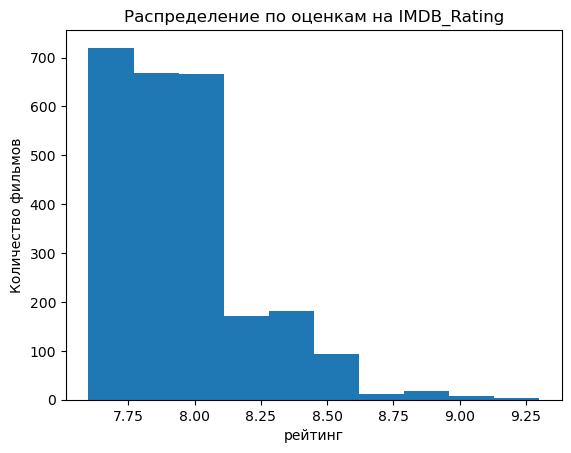

In [138]:
df['IMDB_Rating'].plot(kind='hist', bins=10, title='Распределение по оценкам на IMDB_Rating')
plt.xlabel('рейтинг')
plt.ylabel('Количество фильмов')
plt.show()

In [ ]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='Genre', y='IMDB_Rating', data=df, order=df['Genre'].value_counts().index)
plt.title('Средний рейтинг фильмов по жанрам')
plt.xlabel('Жанр')
plt.ylabel('Рейтинг IMDb')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [170]:
df2['Total_Score'] = df2['IMDB_Rating'] + df2['Meta_score_10']

In [171]:
df2['Total_Score']

0      17.3
1      19.2
2      17.4
3      18.0
4      18.6
5      18.3
6      18.3
7      18.3
8      16.2
9      15.4
10     18.0
11     17.0
12     17.8
13     17.4
14     16.0
15     17.7
16     16.9
17     17.0
18     17.6
19     18.2
20      NaN
21     16.0
22     16.5
23     18.2
24     17.7
25     14.7
26     14.5
27     15.1
28     17.1
29     17.6
30     17.1
31     18.4
32     17.5
33     14.4
34     17.3
35     14.2
36     15.1
37     17.0
38     17.0
39     15.2
40     14.7
41     16.2
42     14.9
43     17.3
44     16.0
45     16.5
46     17.9
47     17.2
48     16.5
49     18.2
50     18.5
51     18.1
52     18.4
53     15.9
54      NaN
55      NaN
56     16.3
57      NaN
58     17.1
59     16.2
60     15.2
61     16.5
62     16.5
63     16.2
64     15.1
65      NaN
66     17.9
67     17.3
68     16.1
69     16.4
70     16.0
71      NaN
72     16.9
73     15.0
74     17.8
75     17.3
76      NaN
77      NaN
78     18.1
79      NaN
80     17.4
81     18.4
82      NaN
83  

In [ ]:
average_score_by_director=df.groupby('Director')['Total_Score'].mean()
average_score_by_certificate

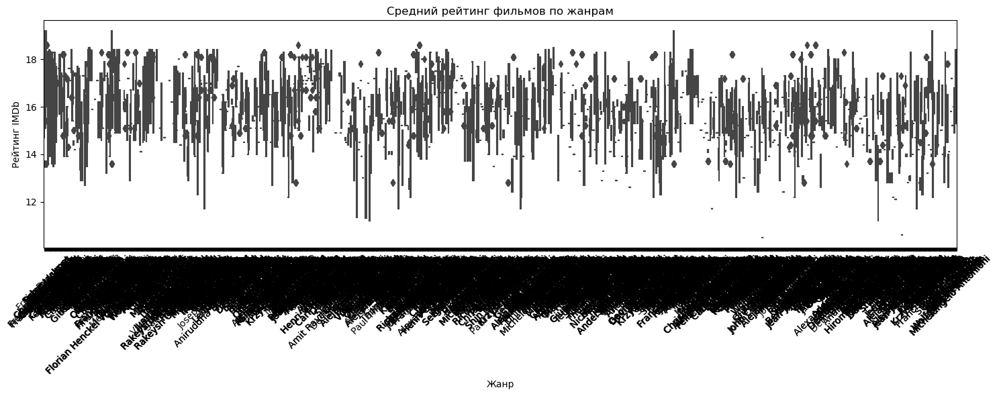

In [145]:
plt.figure(figsize=(15, 6))
sns.boxplot(x='Director', y='Total_Score', data=df, order=df['Director'])
plt.title('Средний рейтинг фильмов по жанрам')
plt.xlabel('Жанр')
plt.ylabel('Рейтинг IMDb')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [172]:
top_directors = df2['Director'].value_counts()
top_directors

Director
Alfred Hitchcock                    14
Steven Spielberg                    13
Hayao Miyazaki                      11
Martin Scorsese                     10
Akira Kurosawa                      10
Stanley Kubrick                      9
Billy Wilder                         9
Woody Allen                          9
Christopher Nolan                    8
Quentin Tarantino                    8
David Fincher                        8
Clint Eastwood                       8
Rob Reiner                           7
Howard Hawks                         7
Ingmar Bergman                       7
Ridley Scott                         6
Alfonso Cuarón                       6
Charles Chaplin                      6
Richard Linklater                    6
Sergio Leone                         6
Joel Coen                            6
Wes Anderson                         6
David Lynch                          5
Sidney Lumet                         5
Denis Villeneuve                     5
Peter Jackson   

In [173]:
top_directors = df2['Director'].value_counts().head(10).index.tolist()

In [174]:
top_directors

['Alfred Hitchcock',
 'Steven Spielberg',
 'Hayao Miyazaki',
 'Martin Scorsese',
 'Akira Kurosawa',
 'Stanley Kubrick',
 'Billy Wilder',
 'Woody Allen',
 'Christopher Nolan',
 'Quentin Tarantino']

In [175]:
df_top_directors = df2[df2['Director'].isin(top_directors)]
df_top_directors

,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross,Meta_score_10,Total_Score
2,https://m.media-amazon.com/images/M/MV5BMTMxNT...,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444",8.4,17.4
6,https://m.media-amazon.com/images/M/MV5BNGNhMD...,Pulp Fiction,1994,A,154 min,"Crime, Drama",8.9,"The lives of two mob hitmen, a boxer, a gangst...",94.0,Quentin Tarantino,John Travolta,Uma Thurman,Samuel L. Jackson,Bruce Willis,1826188,"107,928,762",9.4,18.3
7,https://m.media-amazon.com/images/M/MV5BNDE4OT...,Schindler's List,1993,A,195 min,"Biography, Drama, History",8.9,"In German-occupied Poland during World War II,...",94.0,Steven Spielberg,Liam Neeson,Ralph Fiennes,Ben Kingsley,Caroline Goodall,1213505,"96,898,818",9.4,18.3
8,https://m.media-amazon.com/images/M/MV5BMjAxMz...,Inception,2010,UA,148 min,"Action, Adventure, Sci-Fi",8.8,A thief who steals corporate secrets through t...,74.0,Christopher Nolan,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,2067042,"292,576,195",7.4,16.2
15,https://m.media-amazon.com/images/M/MV5BY2NkZj...,Goodfellas,1990,A,146 min,"Biography, Crime, Drama",8.7,The story of Henry Hill and his life in the mo...,90.0,Martin Scorsese,Robert De Niro,Ray Liotta,Joe Pesci,Lorraine Bracco,1020727,"46,836,394",9.0,17.7
21,https://m.media-amazon.com/images/M/MV5BZjdkOT...,Interstellar,2014,UA,169 min,"Adventure, Drama, Sci-Fi",8.6,A team of explorers travel through a wormhole ...,74.0,Christopher Nolan,Matthew McConaughey,Anne Hathaway,Jessica Chastain,Mackenzie Foy,1512360,"188,020,017",7.4,16.0
23,https://m.media-amazon.com/images/M/MV5BMjlmZm...,Sen to Chihiro no kamikakushi,2001,U,125 min,"Animation, Adventure, Family",8.6,"During her family's move to the suburbs, a sul...",96.0,Hayao Miyazaki,Daveigh Chase,Suzanne Pleshette,Miyu Irino,Rumi Hiiragi,651376,"10,055,859",9.6,18.2
24,https://m.media-amazon.com/images/M/MV5BZjhkMD...,Saving Private Ryan,1998,R,169 min,"Drama, War",8.6,"Following the Normandy Landings, a group of U....",91.0,Steven Spielberg,Tom Hanks,Matt Damon,Tom Sizemore,Edward Burns,1235804,"216,540,909",9.1,17.7
31,https://m.media-amazon.com/images/M/MV5BOWE4ZD...,Shichinin no samurai,1954,U,207 min,"Action, Adventure, Drama",8.6,A poor village under attack by bandits recruit...,98.0,Akira Kurosawa,Toshirô Mifune,Takashi Shimura,Keiko Tsushima,Yukiko Shimazaki,315744,"269,061",9.8,18.4
36,https://m.media-amazon.com/images/M/MV5BMjA4ND...,The Prestige,2006,U,130 min,"Drama, Mystery, Sci-Fi",8.5,"After a tragic accident, two stage magicians e...",66.0,Christopher Nolan,Christian Bale,Hugh Jackman,Scarlett Johansson,Michael Caine,1190259,"53,089,891",6.6,15.1


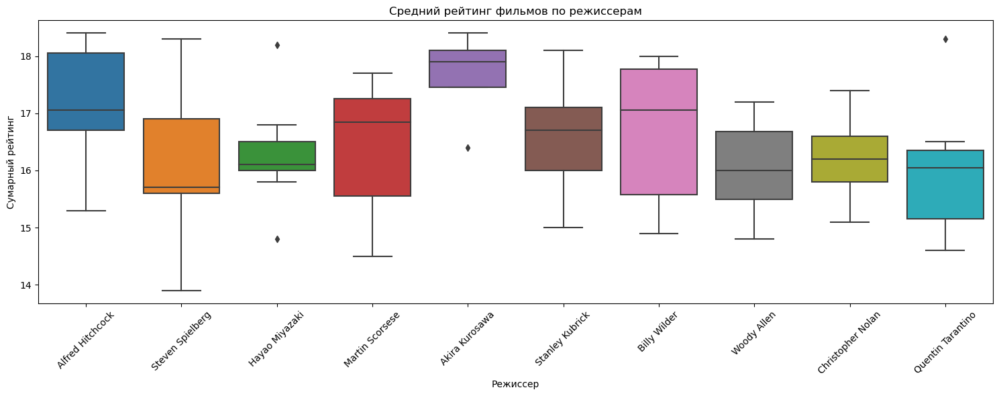

In [176]:
plt.figure(figsize=(15, 6))
sns.boxplot(x='Director', y='Total_Score', data=df_top_directors, order=top_directors)
plt.title('Средний рейтинг фильмов по режиссерам')
plt.xlabel('Режиссер')
plt.ylabel('Сумарный рейтинг')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [177]:
top_directors1 = df2['Director'].value_counts()
top_directors1.head(10)

Director
Alfred Hitchcock     14
Steven Spielberg     13
Hayao Miyazaki       11
Martin Scorsese      10
Akira Kurosawa       10
Stanley Kubrick       9
Billy Wilder          9
Woody Allen           9
Christopher Nolan     8
Quentin Tarantino     8
Name: count, dtype: int64

In [178]:
df2[df2['Director'].str.contains('Akira Kurosawa')]

,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross,Meta_score_10,Total_Score
31,https://m.media-amazon.com/images/M/MV5BOWE4ZD...,Shichinin no samurai,1954,U,207 min,"Action, Adventure, Drama",8.6,A poor village under attack by bandits recruit...,98.0,Akira Kurosawa,Toshirô Mifune,Takashi Shimura,Keiko Tsushima,Yukiko Shimazaki,315744,"269,061",9.8,18.4
77,https://m.media-amazon.com/images/M/MV5BOTI4NT...,Tengoku to jigoku,1963,NaN,143 min,"Crime, Drama, Mystery",8.4,An executive of a shoe company becomes a victi...,NaN,Akira Kurosawa,Toshirô Mifune,Yutaka Sada,Tatsuya Nakadai,Kyôko Kagawa,34357,NaN,NaN,NaN
121,https://m.media-amazon.com/images/M/MV5BZmM0NG...,Ikiru,1952,NaN,143 min,Drama,8.3,A bureaucrat tries to find a meaning in his li...,NaN,Akira Kurosawa,Takashi Shimura,Nobuo Kaneko,Shin'ichi Himori,Haruo Tanaka,68463,"55,240",NaN,NaN
172,https://m.media-amazon.com/images/M/MV5BZDBjZT...,Ran,1985,U,162 min,"Action, Drama, War",8.2,"In Medieval Japan, an elderly warlord retires,...",96.0,Akira Kurosawa,Tatsuya Nakadai,Akira Terao,Jinpachi Nezu,Daisuke Ryû,112505,"4,135,750",9.6,17.8
181,https://m.media-amazon.com/images/M/MV5BZThiZj...,Yôjinbô,1961,NaN,110 min,"Action, Drama, Thriller",8.2,A crafty ronin comes to a town divided by two ...,NaN,Akira Kurosawa,Toshirô Mifune,Eijirô Tôno,Tatsuya Nakadai,Yôko Tsukasa,111244,NaN,NaN,NaN
189,https://m.media-amazon.com/images/M/MV5BMjEzMz...,Rashômon,1950,NaN,88 min,"Crime, Drama, Mystery",8.2,The rape of a bride and the murder of her samu...,98.0,Akira Kurosawa,Toshirô Mifune,Machiko Kyô,Masayuki Mori,Takashi Shimura,152572,"96,568",9.8,18.0
294,https://m.media-amazon.com/images/M/MV5BZmY3MD...,Sanjuro,1962,U,96 min,"Action, Comedy, Crime",8.1,A crafty samurai helps a young man and his fel...,NaN,Akira Kurosawa,Toshirô Mifune,Tatsuya Nakadai,Keiju Kobayashi,Yûnosuke Itô,33044,NaN,NaN,NaN
301,https://m.media-amazon.com/images/M/MV5BYjJkN2...,Kakushi-toride no san-akunin,1958,NaN,139 min,"Adventure, Drama",8.1,"Lured by gold, two greedy peasants unknowingly...",NaN,Akira Kurosawa,Toshirô Mifune,Misa Uehara,Minoru Chiaki,Kamatari Fujiwara,34797,NaN,NaN,NaN
303,https://m.media-amazon.com/images/M/MV5BNGYxZj...,Kumonosu-jô,1957,NaN,110 min,"Drama, History",8.1,"A war-hardened general, egged on by his ambiti...",NaN,Akira Kurosawa,Toshirô Mifune,Minoru Chiaki,Isuzu Yamada,Takashi Shimura,46678,NaN,NaN,NaN
412,https://m.media-amazon.com/images/M/MV5BMzFhNW...,Kagemusha,1980,U,180 min,"Drama, History, War",8.0,A petty thief with an utter resemblance to a s...,84.0,Akira Kurosawa,Tatsuya Nakadai,Tsutomu Yamazaki,Ken'ichi Hagiwara,Jinpachi Nezu,32195,NaN,8.4,16.4


In [157]:
df.drop = df.drop_duplicates()
df

,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross,Meta_score_10,Total_Score
0,The Shawshank Redemption,1994.0,A,142.0,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469",8.0,17.3
1,The Godfather,1972.0,A,175.0,Crime,9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411",10.0,19.2
1,The Godfather,1972.0,A,175.0,Drama,9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411",10.0,19.2
2,The Dark Knight,2008.0,UA,152.0,Action,9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444",8.4,17.4
2,The Dark Knight,2008.0,UA,152.0,Crime,9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444",8.4,17.4
2,The Dark Knight,2008.0,UA,152.0,Drama,9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444",8.4,17.4
3,The Godfather: Part II,1974.0,A,202.0,Crime,9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000",9.0,18.0
3,The Godfather: Part II,1974.0,A,202.0,Drama,9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000",9.0,18.0
4,12 Angry Men,1957.0,U,96.0,Crime,9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000",9.6,18.6
4,12 Angry Men,1957.0,U,96.0,Drama,9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000",9.6,18.6


In [159]:
df2[df2['Director'].str.contains('Akira Kurosawa')]

,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
31,https://m.media-amazon.com/images/M/MV5BOWE4ZD...,Shichinin no samurai,1954,U,207 min,"Action, Adventure, Drama",8.6,A poor village under attack by bandits recruit...,98.0,Akira Kurosawa,Toshirô Mifune,Takashi Shimura,Keiko Tsushima,Yukiko Shimazaki,315744,"269,061"
77,https://m.media-amazon.com/images/M/MV5BOTI4NT...,Tengoku to jigoku,1963,NaN,143 min,"Crime, Drama, Mystery",8.4,An executive of a shoe company becomes a victi...,NaN,Akira Kurosawa,Toshirô Mifune,Yutaka Sada,Tatsuya Nakadai,Kyôko Kagawa,34357,NaN
121,https://m.media-amazon.com/images/M/MV5BZmM0NG...,Ikiru,1952,NaN,143 min,Drama,8.3,A bureaucrat tries to find a meaning in his li...,NaN,Akira Kurosawa,Takashi Shimura,Nobuo Kaneko,Shin'ichi Himori,Haruo Tanaka,68463,"55,240"
172,https://m.media-amazon.com/images/M/MV5BZDBjZT...,Ran,1985,U,162 min,"Action, Drama, War",8.2,"In Medieval Japan, an elderly warlord retires,...",96.0,Akira Kurosawa,Tatsuya Nakadai,Akira Terao,Jinpachi Nezu,Daisuke Ryû,112505,"4,135,750"
181,https://m.media-amazon.com/images/M/MV5BZThiZj...,Yôjinbô,1961,NaN,110 min,"Action, Drama, Thriller",8.2,A crafty ronin comes to a town divided by two ...,NaN,Akira Kurosawa,Toshirô Mifune,Eijirô Tôno,Tatsuya Nakadai,Yôko Tsukasa,111244,NaN
189,https://m.media-amazon.com/images/M/MV5BMjEzMz...,Rashômon,1950,NaN,88 min,"Crime, Drama, Mystery",8.2,The rape of a bride and the murder of her samu...,98.0,Akira Kurosawa,Toshirô Mifune,Machiko Kyô,Masayuki Mori,Takashi Shimura,152572,"96,568"
294,https://m.media-amazon.com/images/M/MV5BZmY3MD...,Sanjuro,1962,U,96 min,"Action, Comedy, Crime",8.1,A crafty samurai helps a young man and his fel...,NaN,Akira Kurosawa,Toshirô Mifune,Tatsuya Nakadai,Keiju Kobayashi,Yûnosuke Itô,33044,NaN
301,https://m.media-amazon.com/images/M/MV5BYjJkN2...,Kakushi-toride no san-akunin,1958,NaN,139 min,"Adventure, Drama",8.1,"Lured by gold, two greedy peasants unknowingly...",NaN,Akira Kurosawa,Toshirô Mifune,Misa Uehara,Minoru Chiaki,Kamatari Fujiwara,34797,NaN
303,https://m.media-amazon.com/images/M/MV5BNGYxZj...,Kumonosu-jô,1957,NaN,110 min,"Drama, History",8.1,"A war-hardened general, egged on by his ambiti...",NaN,Akira Kurosawa,Toshirô Mifune,Minoru Chiaki,Isuzu Yamada,Takashi Shimura,46678,NaN
412,https://m.media-amazon.com/images/M/MV5BMzFhNW...,Kagemusha,1980,U,180 min,"Drama, History, War",8.0,A petty thief with an utter resemblance to a s...,84.0,Akira Kurosawa,Tatsuya Nakadai,Tsutomu Yamazaki,Ken'ichi Hagiwara,Jinpachi Nezu,32195,NaN


In [165]:
df2['Director']

0                        Frank Darabont
1                  Francis Ford Coppola
2                     Christopher Nolan
3                  Francis Ford Coppola
4                          Sidney Lumet
5                         Peter Jackson
6                     Quentin Tarantino
7                      Steven Spielberg
8                     Christopher Nolan
9                         David Fincher
10                        Peter Jackson
11                      Robert Zemeckis
12                         Sergio Leone
13                        Peter Jackson
14                       Lana Wachowski
15                      Martin Scorsese
16                       Irvin Kershner
17                         Milos Forman
18                          Thomas Kail
19                         Bong Joon Ho
20                        Sudha Kongara
21                    Christopher Nolan
22                   Fernando Meirelles
23                       Hayao Miyazaki
24                     Steven Spielberg


In [169]:
df2['Meta_score_10']=df2['Meta_score']/10

In [ ]:
# Построение линейного графика среднего рейтинга фильмов по годам
plt.figure(figsize=(10, 6))
average_ratings_by_votes.plot(kind='line', color='blue')
plt.title('Средний рейтинг фильмов по годам выпуска')
plt.xlabel('Год выпуска')
plt.ylabel('Средний рейтинг')
plt.grid(True)
plt.show()

In [183]:
average_ratings_by_votes =df2.groupby('No_of_Votes')['Total_Score'].mean()
average_ratings_by_votes.head(3)

No_of_Votes
25088     NaN
25198    16.2
25229    15.1
Name: Total_Score, dtype: float64

In [182]:
df2.head(3)

,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross,Meta_score_10,Total_Score
0,https://m.media-amazon.com/images/M/MV5BMDFkYT...,The Shawshank Redemption,1994,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469",8.0,17.3
1,https://m.media-amazon.com/images/M/MV5BM2MyNj...,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411",10.0,19.2
2,https://m.media-amazon.com/images/M/MV5BMTMxNT...,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444",8.4,17.4


In [1]:
df2['Total_Score'].isnull()


NameError: name 'df2' is not defined

In [186]:
df2

,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross,Meta_score_10,Total_Score
0,https://m.media-amazon.com/images/M/MV5BMDFkYT...,The Shawshank Redemption,1994,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469",8.0,17.3
1,https://m.media-amazon.com/images/M/MV5BM2MyNj...,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411",10.0,19.2
2,https://m.media-amazon.com/images/M/MV5BMTMxNT...,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444",8.4,17.4
3,https://m.media-amazon.com/images/M/MV5BMWMwMG...,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000",9.0,18.0
4,https://m.media-amazon.com/images/M/MV5BMWU4N2...,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000",9.6,18.6
5,https://m.media-amazon.com/images/M/MV5BNzA5ZD...,The Lord of the Rings: The Return of the King,2003,U,201 min,"Action, Adventure, Drama",8.9,Gandalf and Aragorn lead the World of Men agai...,94.0,Peter Jackson,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,1642758,"377,845,905",9.4,18.3
6,https://m.media-amazon.com/images/M/MV5BNGNhMD...,Pulp Fiction,1994,A,154 min,"Crime, Drama",8.9,"The lives of two mob hitmen, a boxer, a gangst...",94.0,Quentin Tarantino,John Travolta,Uma Thurman,Samuel L. Jackson,Bruce Willis,1826188,"107,928,762",9.4,18.3
7,https://m.media-amazon.com/images/M/MV5BNDE4OT...,Schindler's List,1993,A,195 min,"Biography, Drama, History",8.9,"In German-occupied Poland during World War II,...",94.0,Steven Spielberg,Liam Neeson,Ralph Fiennes,Ben Kingsley,Caroline Goodall,1213505,"96,898,818",9.4,18.3
8,https://m.media-amazon.com/images/M/MV5BMjAxMz...,Inception,2010,UA,148 min,"Action, Adventure, Sci-Fi",8.8,A thief who steals corporate secrets through t...,74.0,Christopher Nolan,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,2067042,"292,576,195",7.4,16.2
9,https://m.media-amazon.com/images/M/MV5BMmEzNT...,Fight Club,1999,A,139 min,Drama,8.8,An insomniac office worker and a devil-may-car...,66.0,David Fincher,Brad Pitt,Edward Norton,Meat Loaf,Zach Grenier,1854740,"37,030,102",6.6,15.4


NameError: name 'df' is not defined